In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/datasets/nabilsherif/oil-spill/oil-spill/test/labels/img_0079.png
/kaggle/input/datasets/nabilsherif/oil-spill/oil-spill/test/labels/img_0072.png
/kaggle/input/datasets/nabilsherif/oil-spill/oil-spill/test/labels/img_0068.png
/kaggle/input/datasets/nabilsherif/oil-spill/oil-spill/test/labels/img_0049.png
/kaggle/input/datasets/nabilsherif/oil-spill/oil-spill/test/labels/img_0087.png
/kaggle/input/datasets/nabilsherif/oil-spill/oil-spill/test/labels/img_0057.png
/kaggle/input/datasets/nabilsherif/oil-spill/oil-spill/test/labels/img_0044.png
/kaggle/input/datasets/nabilsherif/oil-spill/oil-spill/test/labels/img_0070.png
/kaggle/input/datasets/nabilsherif/oil-spill/oil-spill/test/labels/img_0078.png
/kaggle/input/datasets/nabilsherif/oil-spill/oil-spill/test/labels/img_0003.png
/kaggle/input/datasets/nabilsherif/oil-spill/oil-spill/test/labels/img_0071.png
/kaggle/input/datasets/nabilsherif/oil-spill/oil-spill/test/labels/img_0032.png
/kaggle/input/datasets/nabilsherif/oil-s

In [ ]:
import os
for root, dirs, files in os.walk('/kaggle/input'):
    print(root)

**IMPORT THE NECESSARY LIBRARIES**

In [2]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import cv2
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K


E0000 00:00:1775300944.596657      55 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1775300944.713504      55 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1775300945.697221      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1775300945.697281      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1775300945.697284      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1775300945.697306      55 computation_placer.cc:177] computation placer already registered. Please check linka

**Dataset Paths**

In [3]:
TRAIN_IMG_PATH = "/kaggle/input/datasets/nabilsherif/oil-spill/oil-spill/train/images"
TRAIN_MASK_PATH = "/kaggle/input/datasets/nabilsherif/oil-spill/oil-spill/train/labels"

TEST_IMG_PATH = "/kaggle/input/datasets/nabilsherif/oil-spill/oil-spill/test/images"
TEST_MASK_PATH = "/kaggle/input/datasets/nabilsherif/oil-spill/oil-spill/test/labels"

IMG_SIZE = 256


**Number of images and masks**

In [4]:
print("Train images:", len(os.listdir(TRAIN_IMG_PATH)))
print("Train masks:", len(os.listdir(TRAIN_MASK_PATH)))

print("Test images:", len(os.listdir(TEST_IMG_PATH)))
print("Test masks:", len(os.listdir(TEST_MASK_PATH)))


Train images: 1002
Train masks: 1002
Test images: 110
Test masks: 110


**Image Resolution**

In [5]:
sample = cv2.imread(os.path.join(TRAIN_IMG_PATH, os.listdir(TRAIN_IMG_PATH)[0]), 0)
print("Original image shape:", sample.shape)


Original image shape: (650, 1250)


**Display 5 Image–Mask Pairs**

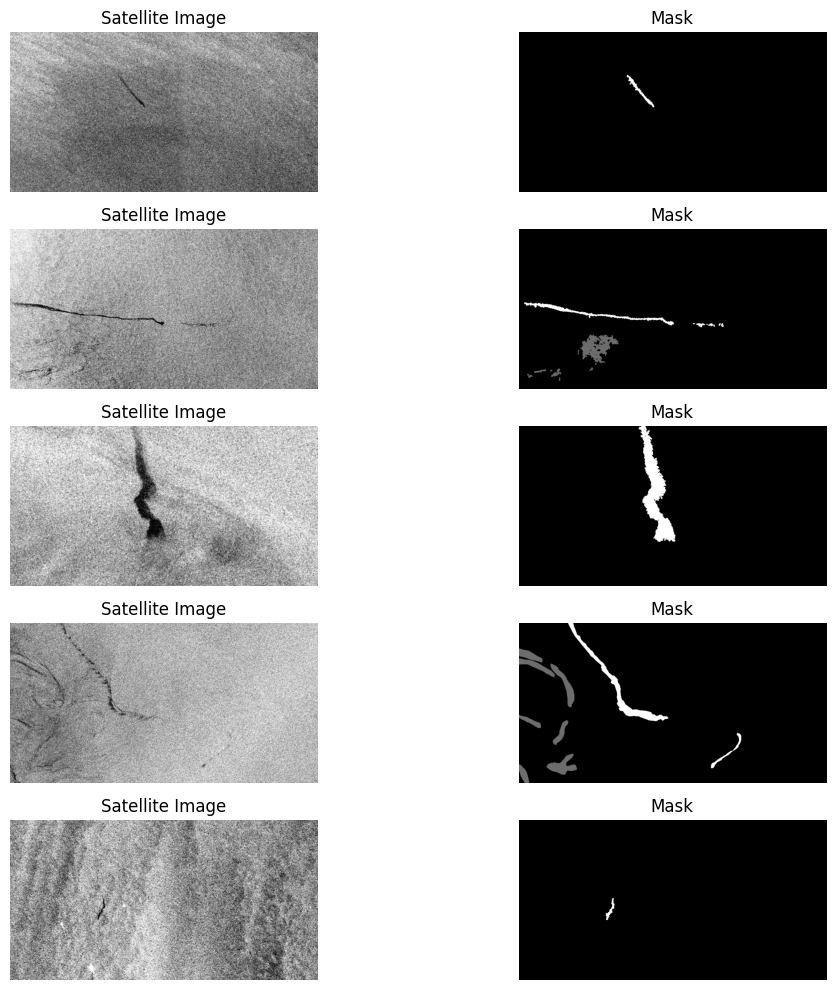

In [6]:
train_images = sorted(os.listdir(TRAIN_IMG_PATH))
train_masks = sorted(os.listdir(TRAIN_MASK_PATH))

plt.figure(figsize=(12,10))

for i in range(5):
    img = cv2.imread(os.path.join(TRAIN_IMG_PATH, train_images[i]), 0)
    mask = cv2.imread(os.path.join(TRAIN_MASK_PATH, train_masks[i]), 0)

    plt.subplot(5,2,2*i+1)
    plt.imshow(img, cmap='gray')
    plt.title("Satellite Image")
    plt.axis('off')

    plt.subplot(5,2,2*i+2)
    plt.imshow(mask, cmap='gray')
    plt.title("Mask")
    plt.axis('off')

plt.tight_layout()
plt.show()


**CLASS DISTRIBUTION**

In [8]:
oil_pixels = 0
background_pixels = 0

for mask_file in train_masks:
    mask = cv2.imread(os.path.join(TRAIN_MASK_PATH, mask_file), 0)
    oil_pixels += np.sum(mask > 0)
    background_pixels += np.sum(mask == 0)

print("Oil pixels:", oil_pixels)
print("Background pixels:", background_pixels)

print("Oil %:",
      100 * oil_pixels / (oil_pixels + background_pixels))


Oil pixels: 97238068
Background pixels: 716886932
Oil %: 11.943874466451712


**Preprocessing pipeline**

In [9]:
def load_data(image_dir, mask_dir):
    images = []
    masks = []

    image_files = sorted(os.listdir(image_dir))

    for file in tqdm(image_files):
        img_path = os.path.join(image_dir, file)
        filename = os.path.splitext(file)[0]

        mask_path = os.path.join(mask_dir, filename + ".png")
        if not os.path.exists(mask_path):
            continue

        # Read SAR image (grayscale)
        img = cv2.imread(img_path, 0)
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
        img = img / 255.0
        img = np.expand_dims(img, axis=-1)

        # Read mask
        mask = cv2.imread(mask_path, 0)
        mask = cv2.resize(mask, (IMG_SIZE, IMG_SIZE))
        mask = mask / 255.0
        mask = (mask > 0.5).astype(np.float32)
        mask = np.expand_dims(mask, axis=-1)

        images.append(img)
        masks.append(mask)

    return np.array(images), np.array(masks)


**Load & Split**

In [10]:
X_train_full, y_train_full = load_data(TRAIN_IMG_PATH, TRAIN_MASK_PATH)

print("Full training samples:", X_train_full.shape[0])


100%|██████████| 1002/1002 [00:30<00:00, 33.12it/s]


Full training samples: 1002


In [11]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(
    X_train_full, y_train_full,
    test_size=0.20,
    random_state=42
)

print("Train:", X_train.shape[0])
print("Validation:", X_val.shape[0])


Train: 801
Validation: 201


In [12]:
X_test, y_test = load_data(TEST_IMG_PATH, TEST_MASK_PATH)

print("Test:", X_test.shape[0])

100%|██████████| 110/110 [00:04<00:00, 27.41it/s]

Test: 110


**Data Augmentation**

In [13]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

data_gen_args = dict(
    rotation_range=20,
    horizontal_flip=True,
    vertical_flip=True,
    zoom_range=0.2,
    brightness_range=[0.8, 1.2]
)

image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)

**Before vs After Visualization**

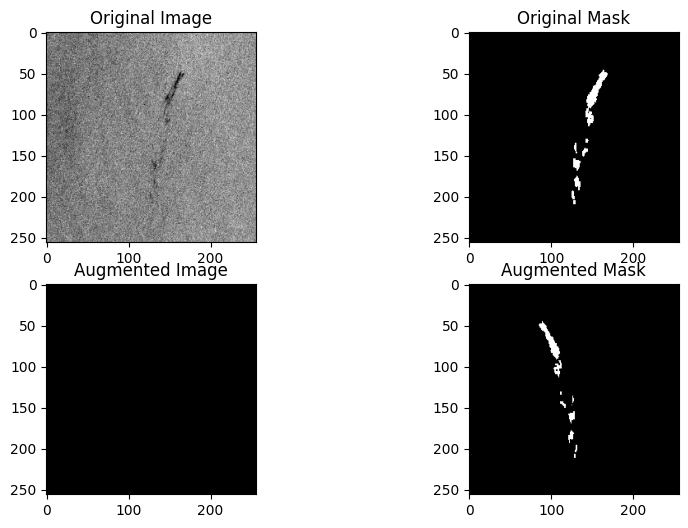

In [14]:
sample_img = X_train[0]
sample_mask = y_train[0]

aug_img = image_datagen.random_transform(sample_img)
aug_mask = mask_datagen.random_transform(sample_mask)
aug_mask = (aug_mask > 0.5).astype(np.float32)

plt.figure(figsize=(10,6))

plt.subplot(2,2,1)
plt.imshow(sample_img.squeeze(), cmap='gray')
plt.title("Original Image")

plt.subplot(2,2,2)
plt.imshow(sample_mask.squeeze(), cmap='gray')
plt.title("Original Mask")

plt.subplot(2,2,3)
plt.imshow(aug_img.squeeze(), cmap='gray')
plt.title("Augmented Image")

plt.subplot(2,2,4)
plt.imshow(aug_mask.squeeze(), cmap='gray')
plt.title("Augmented Mask")

plt.show()

In [15]:
def train_generator(X_train, y_train, batch_size=8):
    seed = 42
    
    image_generator = image_datagen.flow(
        X_train,
        batch_size=batch_size,
        seed=seed
    )

    mask_generator = mask_datagen.flow(
        y_train,
        batch_size=batch_size,
        seed=seed
    )

    while True:
        img = image_generator.next()
        mask = mask_generator.next()
        yield img, mask

**MODEL (U-Net)**

In [16]:
def unet_model(input_size=(256,256,1)):
    inputs = layers.Input(input_size)

    c1 = layers.Conv2D(64, 3, activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(64, 3, activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D()(c1)

    c2 = layers.Conv2D(128, 3, activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(128, 3, activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D()(c2)

    c3 = layers.Conv2D(256, 3, activation='relu', padding='same')(p2)
    c3 = layers.Conv2D(256, 3, activation='relu', padding='same')(c3)
    p3 = layers.MaxPooling2D()(c3)

    c4 = layers.Conv2D(512, 3, activation='relu', padding='same')(p3)
    c4 = layers.Conv2D(512, 3, activation='relu', padding='same')(c4)

    u5 = layers.UpSampling2D()(c4)
    u5 = layers.concatenate([u5, c3])
    c5 = layers.Conv2D(256, 3, activation='relu', padding='same')(u5)
    c5 = layers.Conv2D(256, 3, activation='relu', padding='same')(c5)

    u6 = layers.UpSampling2D()(c5)
    u6 = layers.concatenate([u6, c2])
    c6 = layers.Conv2D(128, 3, activation='relu', padding='same')(u6)
    c6 = layers.Conv2D(128, 3, activation='relu', padding='same')(c6)

    u7 = layers.UpSampling2D()(c6)
    u7 = layers.concatenate([u7, c1])
    c7 = layers.Conv2D(64, 3, activation='relu', padding='same')(u7)
    c7 = layers.Conv2D(64, 3, activation='relu', padding='same')(c7)

    outputs = layers.Conv2D(1, 1, activation='sigmoid')(c7)

    return models.Model(inputs, outputs)


In [17]:
model = unet_model()
model.summary()

I0000 00:00:1775301212.879777      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13757 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1775301212.885965      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13757 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        640 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │     36,928 │ conv2d[0][0]      │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │    147,584 │ conv2d_2[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │    590,080 │ conv2d_4[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 32, 32,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 32, 32,    │  1,180,160 │ max_pooling2d_2[… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 32, 32,    │  2,359,808 │ conv2d_6[0][0]    │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 64, 64,    │          0 │ conv2d_7[0][0]    │
│ (UpSampling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 64, 64,    │          0 │ up_sampling2d[0]… │
│ (Concatenate)       │ 768)              │            │ conv2d_5[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 64, 64,    │  1,769,728 │ concatenate[0][0] │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 64, 64,    │    590,080 │ conv2d_8[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_1     │ (None, 128, 128,  │          0 │ conv2d_9[0][0]  

 Total params: 7,781,761 (29.69 MB)

 Trainable params: 7,781,761 (29.69 MB)

 Non-trainable params: 0 (0.00 B)

**LOSS FUNCTION**

In [18]:
def dice_coef(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def weighted_bce_dice_loss(y_true, y_pred):
    weight = 8.0   # helps imbalance

    bce = tf.keras.backend.binary_crossentropy(y_true, y_pred)
    weighted_bce = bce * (1 + weight * y_true)
    weighted_bce = tf.reduce_mean(weighted_bce)

    dice = 1 - dice_coef(y_true, y_pred)

    return weighted_bce + dice

**IoU metric**

In [19]:
def iou_metric(y_true, y_pred):
    smooth = 1.
    
    # Convert predictions to binary
    y_pred = tf.cast(y_pred > 0.5, tf.float32)
    
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection
    
    return (intersection + smooth) / (union + smooth)

**Compile & Train**

In [20]:
# Create model
model = unet_model()

# Compile model
model.compile(
    optimizer=Adam(1e-4),
    loss=weighted_bce_dice_loss,
    metrics=[dice_coef, iou_metric]
)

**Early stopping**

In [21]:
from tensorflow.keras.callbacks import EarlyStopping

early_stop = EarlyStopping(
    monitor='val_dice_coef',
    patience=3,
    mode='max',
    restore_best_weights=True
)


**Model training**

In [22]:
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=30,
    batch_size=8,
    callbacks=[early_stop]
)


Epoch 1/30


I0000 00:00:1775301242.630094     139 service.cc:152] XLA service 0x7f907c01ea60 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1775301242.630134     139 service.cc:160]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1775301242.630138     139 service.cc:160]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1775301243.624907     139 cuda_dnn.cc:529] Loaded cuDNN version 91002
I0000 00:00:1775301278.306981     139 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


101/101 ━━━━━━━━━━━━━━━━━━━━ 111s 704ms/step - dice_coef: 0.0287 - iou_metric: 0.0047 - loss: 1.3964 - val_dice_coef: 0.1500 - val_iou_metric: 0.1559 - val_loss: 1.1470
Epoch 2/30
101/101 ━━━━━━━━━━━━━━━━━━━━ 42s 421ms/step - dice_coef: 0.2114 - iou_metric: 0.1969 - loss: 1.0157 - val_dice_coef: 0.2771 - val_iou_metric: 0.2362 - val_loss: 0.9134
Epoch 3/30
101/101 ━━━━━━━━━━━━━━━━━━━━ 42s 414ms/step - dice_coef: 0.3097 - iou_metric: 0.2518 - loss: 0.8907 - val_dice_coef: 0.3835 - val_iou_metric: 0.2773 - val_loss: 0.8455
Epoch 4/30
101/101 ━━━━━━━━━━━━━━━━━━━━ 42s 416ms/step - dice_coef: 0.3307 - iou_metric: 0.2484 - loss: 0.8711 - val_dice_coef: 0.3701 - val_iou_metric: 0.2917 - val_loss: 0.7832
Epoch 5/30
101/101 ━━━━━━━━━━━━━━━━━━━━ 42s 418ms/step - dice_coef: 0.4046 - iou_metric: 0.3078 - loss: 0.7815 - val_dice_coef: 0.3715 - val_iou_metric: 0.2958 - val_loss: 0.7592
Epoch 6/30
101/101 ━━━━━━━━━━━━━━━━━━━━ 42s 416ms/step - dice_coef: 0.4286 - iou_metric: 0.3311 - loss: 0.7271 - va

**SAVE MODEL**

In [23]:
model.save("/kaggle/working/oil_spill_unet_model_v3.h5")

In [24]:
def post_process(pred):
    pred = (pred > 0.3).astype(np.uint8)

    pred = cv2.medianBlur(pred*255, 5)

    kernel = np.ones((3,3), np.uint8)
    pred = cv2.morphologyEx(pred, cv2.MORPH_CLOSE, kernel)

    return pred / 255.0

**PERFORMANCE METRICS**

In [25]:
import numpy as np
import cv2

# -------------------------------
# 1. POST-PROCESS FUNCTION
# -------------------------------
def post_process(pred):
    # Threshold
    pred = (pred > 0.3).astype(np.uint8)

    # Smooth (remove noise)
    pred = cv2.medianBlur(pred * 255, 5)

    # Morphological closing (fill gaps)
    kernel = np.ones((3,3), np.uint8)
    pred = cv2.morphologyEx(pred, cv2.MORPH_CLOSE, kernel)

    return pred / 255.0


# -------------------------------
# 2. METRICS FUNCTION
# -------------------------------
def calculate_metrics(y_true, preds):
    y_true = y_true.flatten()
    y_pred = preds.flatten()

    TP = np.sum((y_true == 1) & (y_pred == 1))
    TN = np.sum((y_true == 0) & (y_pred == 0))
    FP = np.sum((y_true == 0) & (y_pred == 1))
    FN = np.sum((y_true == 1) & (y_pred == 0))

    accuracy = (TP + TN) / (TP + TN + FP + FN + 1e-7)
    precision = TP / (TP + FP + 1e-7)
    recall = TP / (TP + FN + 1e-7)

    return accuracy, precision, recall


# -------------------------------
# 3. IoU + DICE
# -------------------------------
def compute_iou_dice(y_true, preds):
    y_true = y_true.flatten()
    y_pred = preds.flatten()

    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection

    iou = intersection / (union + 1e-6)
    dice = (2 * intersection) / (np.sum(y_true) + np.sum(y_pred) + 1e-6)

    return iou, dice


# -------------------------------
# 4. PREDICT
# -------------------------------
print("Running predictions...")
preds = model.predict(X_test)


# -------------------------------
# 5. POST-PROCESS ALL PREDICTIONS
# -------------------------------
processed_preds = np.array([
    post_process(p.squeeze()) for p in preds
])


# -------------------------------
# 6. CALCULATE METRICS
# -------------------------------
accuracy, precision, recall = calculate_metrics(y_test, processed_preds)
iou, dice = compute_iou_dice(y_test, processed_preds)


# -------------------------------
# 7. PRINT RESULTS
# -------------------------------
print("\n===== FINAL MODEL PERFORMANCE =====")
print("Accuracy :", accuracy)
print("Precision:", precision)
print("Recall   :", recall)
print("IoU      :", iou)
print("Dice     :", dice)

Running predictions...
4/4 ━━━━━━━━━━━━━━━━━━━━ 60s 7s/step 

===== FINAL MODEL PERFORMANCE =====
Accuracy : 0.9885314941406114
Precision: 0.45969565549812685
Recall   : 0.558866887126235
IoU      : 0.3373037184259216
Dice     : 0.5044534218792813


In [26]:
test_results = model.evaluate(X_test, y_test)

print("Test Dice:", test_results[1])
print("Test IoU:", test_results[2])

4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 615ms/step - dice_coef: 0.4787 - iou_metric: 0.3476 - loss: 0.7530
Test Dice: 0.4794975221157074
Test IoU: 0.3503705561161041


In [27]:
print("Best val Dice:", max(history.history['val_dice_coef']))

Best val Dice: 0.4684433937072754


**Prediction Visualization**

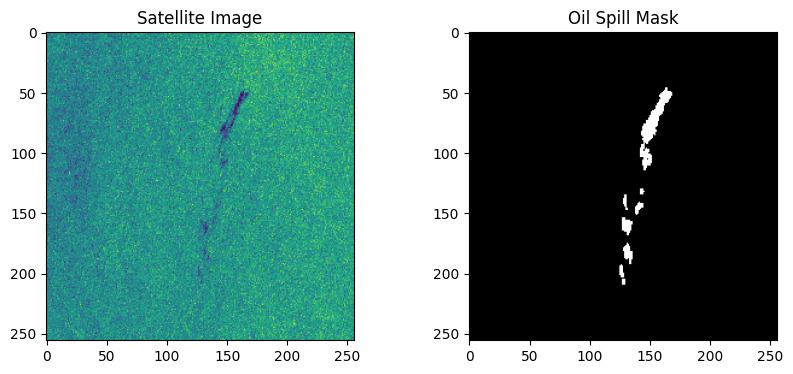

In [28]:
plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.imshow(X_train[0])
plt.title("Satellite Image")

plt.subplot(1,2,2)
plt.imshow(y_train[0].squeeze(), cmap='gray')
plt.title("Oil Spill Mask")

plt.show()


**Oil Distribution analysis**

In [29]:
import os
import cv2
import numpy as np

TRAIN_MASK_PATH = "/kaggle/input/datasets/nabilsherif/oil-spill/oil-spill/train/labels"

oil_pixels = 0
background_pixels = 0
total_images = 0

for mask_file in os.listdir(TRAIN_MASK_PATH):
    
    mask_path = os.path.join(TRAIN_MASK_PATH, mask_file)
    
    # Read mask in grayscale
    mask = cv2.imread(mask_path, 0)
    
    if mask is None:
        continue
    
    total_images += 1
    
    # Convert to binary (important)
    mask = (mask > 0).astype(np.uint8)
    
    oil_pixels += np.sum(mask == 1)
    background_pixels += np.sum(mask == 0)

total_pixels = oil_pixels + background_pixels

oil_percentage = 100 * oil_pixels / total_pixels
background_percentage = 100 * background_pixels / total_pixels

print("Total Images:", total_images)
print("Total Pixels:", total_pixels)
print("Oil Pixels:", oil_pixels)
print("Background Pixels:", background_pixels)
print("Oil Percentage: {:.4f}%".format(oil_percentage))
print("Background Percentage: {:.4f}%".format(background_percentage))

Total Images: 1002
Total Pixels: 814125000
Oil Pixels: 97238068
Background Pixels: 716886932
Oil Percentage: 11.9439%
Background Percentage: 88.0561%


**OIL AND BACKGROUND DISTRIBUTION VISUALIZATION**

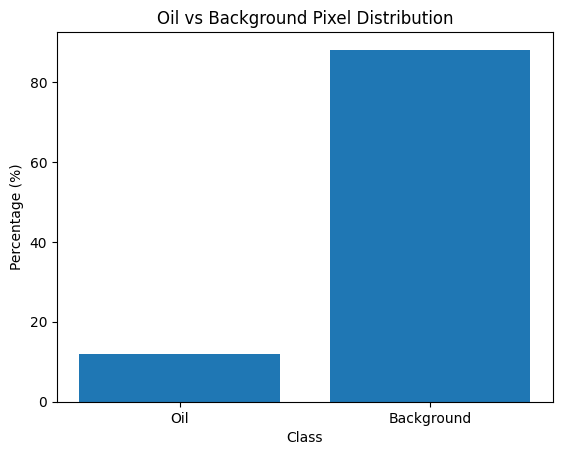

In [30]:
import matplotlib.pyplot as plt

# Values
labels = ['Oil', 'Background']
values = [oil_percentage, background_percentage]

# Create single bar plot
plt.figure()
plt.bar(labels, values)

plt.title("Oil vs Background Pixel Distribution")
plt.ylabel("Percentage (%)")
plt.xlabel("Class")

plt.show()

**PIXEL WISE DISTRIBUTION ANALYSIS**

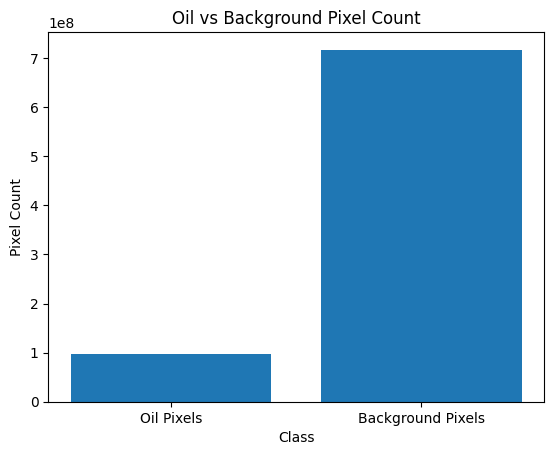

In [31]:
labels = ['Oil Pixels', 'Background Pixels']
values = [oil_pixels, background_pixels]

plt.figure()
plt.bar(labels, values)

plt.title("Oil vs Background Pixel Count")
plt.ylabel("Pixel Count")
plt.xlabel("Class")

plt.show()

**LOSS CURVE & DICE CURVE**

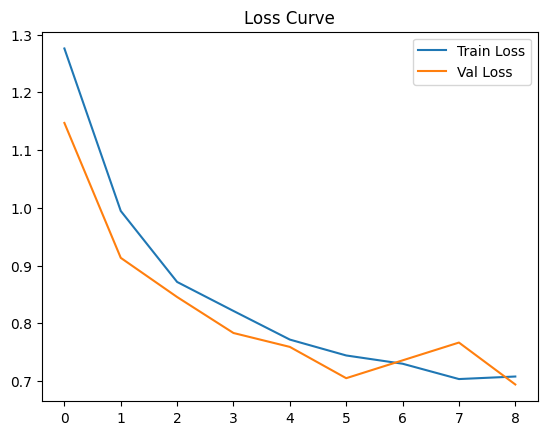

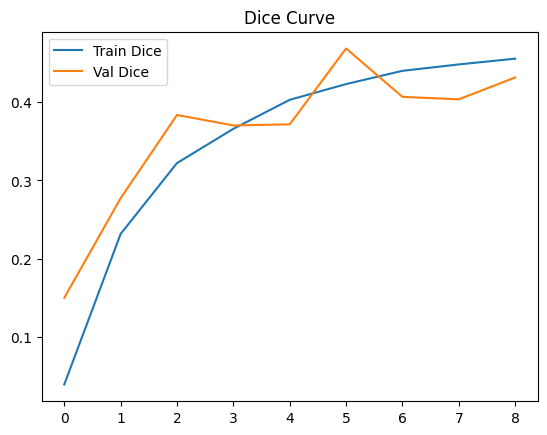

In [32]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Train Loss', 'Val Loss'])
plt.title('Loss Curve')
plt.show()

plt.plot(history.history['dice_coef'])
plt.plot(history.history['val_dice_coef'])
plt.legend(['Train Dice', 'Val Dice'])
plt.title('Dice Curve')
plt.show()


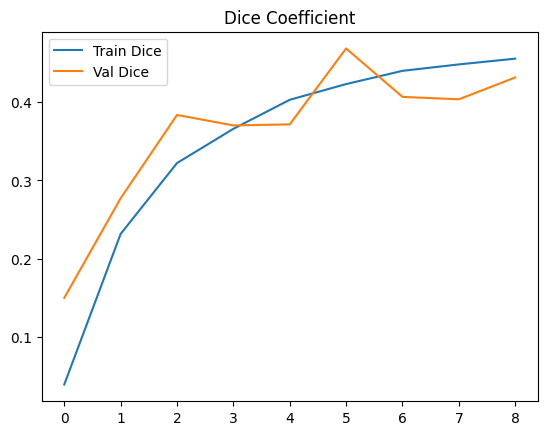

In [33]:
plt.plot(history.history['dice_coef'])
plt.plot(history.history['val_dice_coef'])
plt.legend(['Train Dice', 'Val Dice'])
plt.title('Dice Coefficient')
plt.show()


**IOU curve**

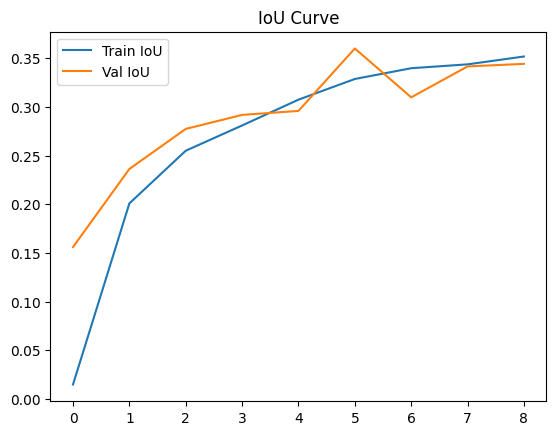

In [34]:
plt.plot(history.history['iou_metric'])
plt.plot(history.history['val_iou_metric'])
plt.legend(['Train IoU', 'Val IoU'])
plt.title('IoU Curve')
plt.show()

**CONFUSION MATRIX(Pixel-level)**

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 388ms/step


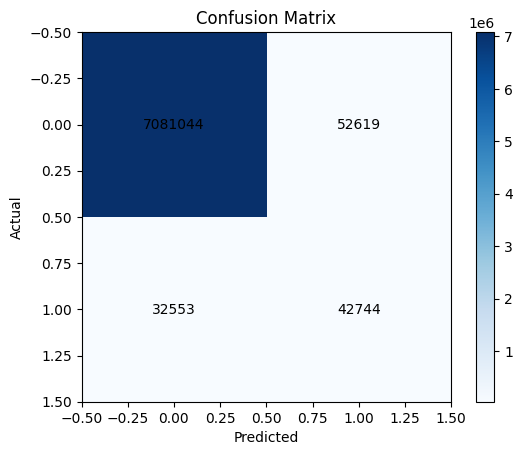

Confusion Matrix:
 [[7081044   52619]
 [  32553   42744]]


In [35]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

preds = model.predict(X_test)
preds = (preds > 0.3).astype(np.uint8)

y_true = y_test.flatten()
y_pred = preds.flatten()

cm = confusion_matrix(y_true, y_pred)

plt.figure()
plt.imshow(cm, cmap='Blues')
plt.colorbar()

for i in range(2):
    for j in range(2):
        plt.text(j, i, cm[i, j], ha='center', va='center')

plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

print("Confusion Matrix:\n", cm)

**Oil Area Distribution Across Images**

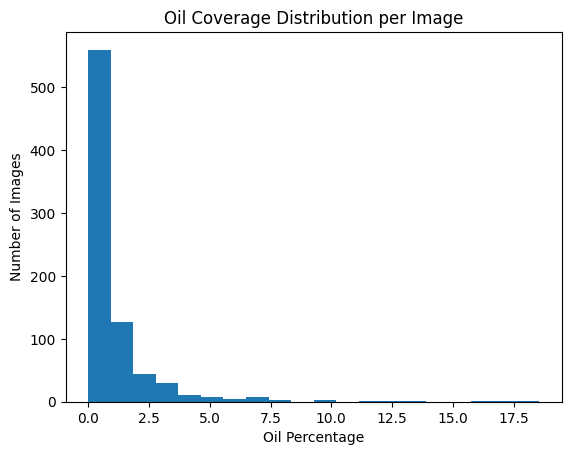

In [36]:
oil_percentages = []

for mask in y_train:
    oil_percentages.append(np.sum(mask) / (256*256) * 100)

plt.figure()
plt.hist(oil_percentages, bins=20)
plt.title("Oil Coverage Distribution per Image")
plt.xlabel("Oil Percentage")
plt.ylabel("Number of Images")
plt.show()

**PREDICTION VISUALIZATION**

1/1 ━━━━━━━━━━━━━━━━━━━━ 21s 21s/step


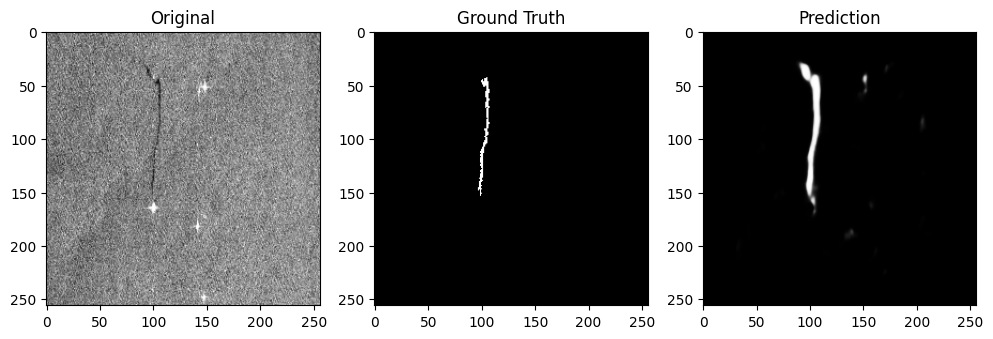

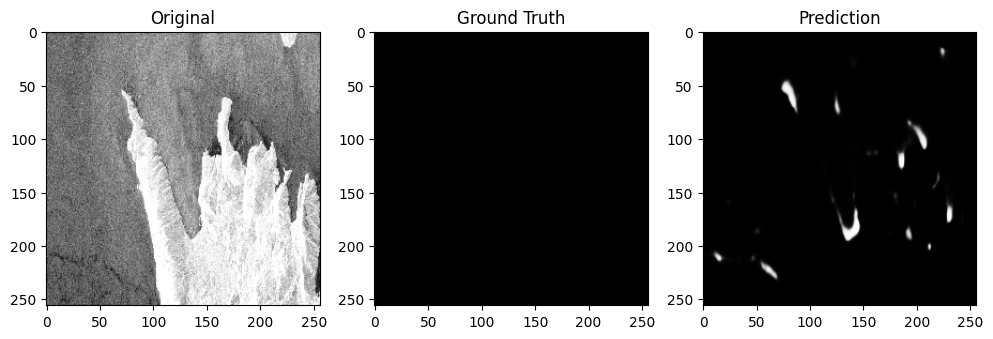

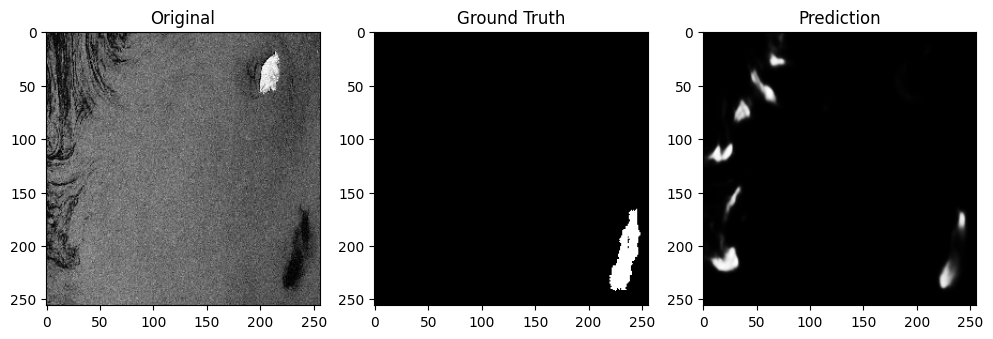

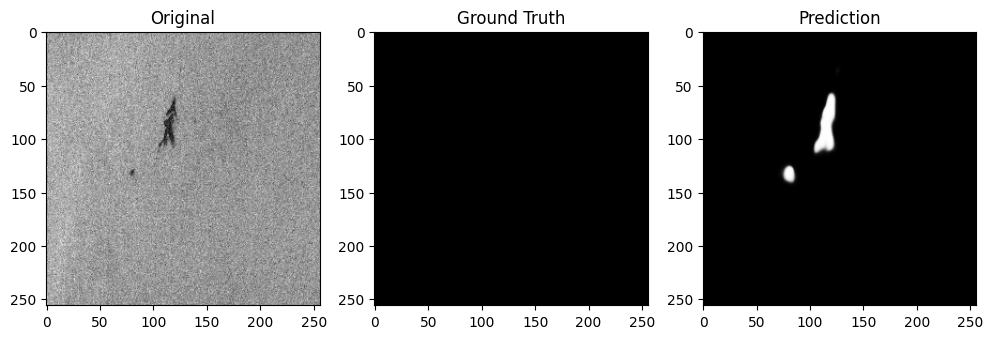

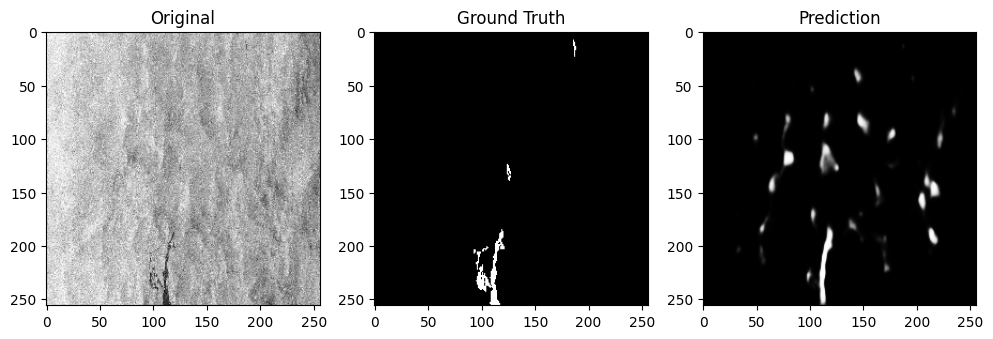

...

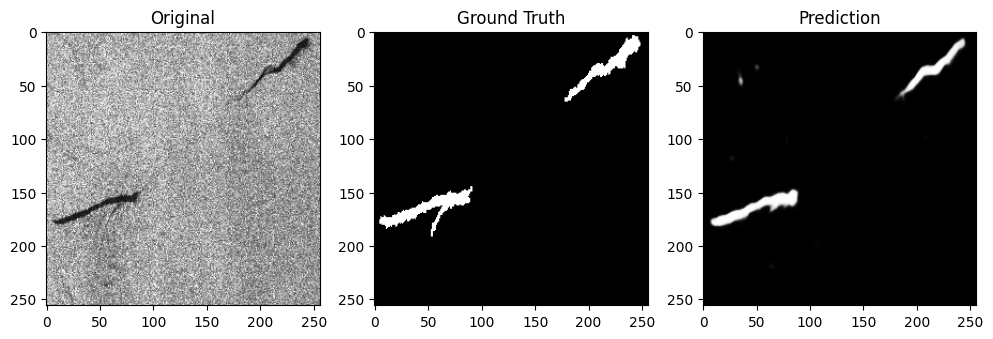

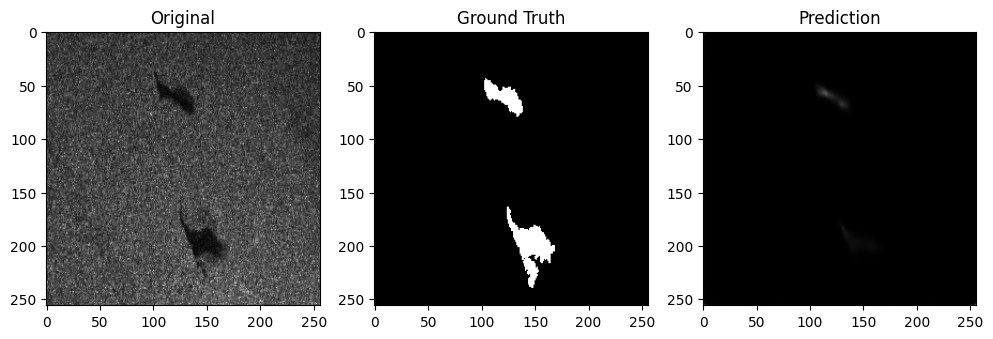

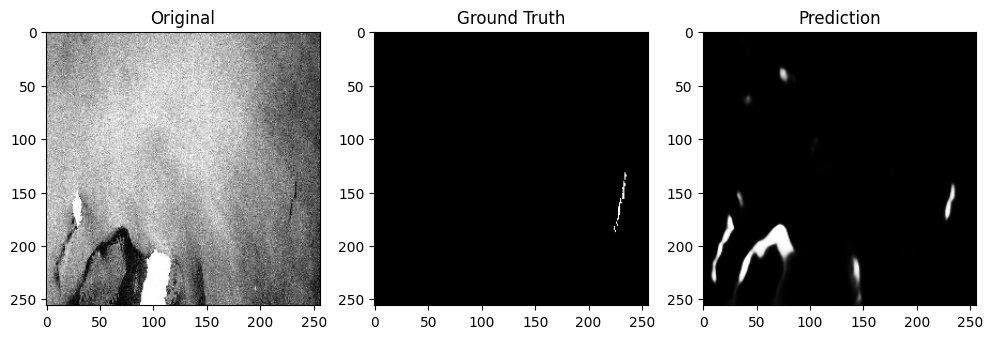

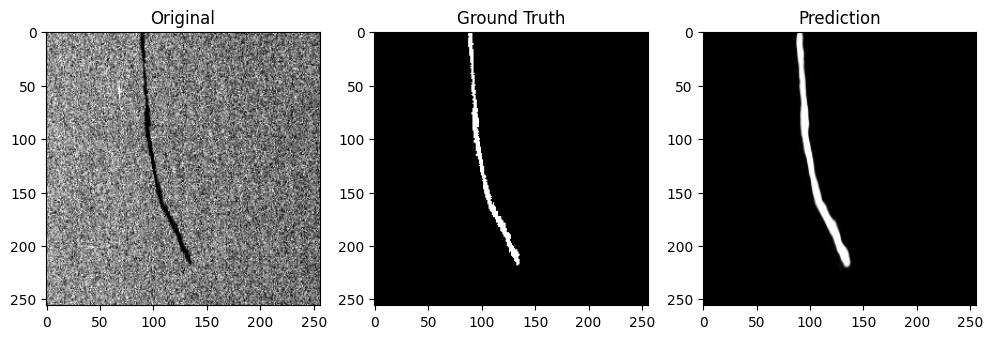

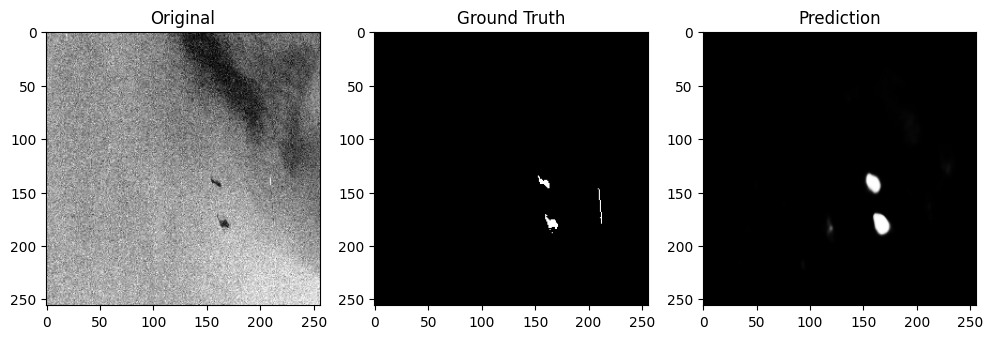

In [37]:
preds = model.predict(X_test[:15])

for i in range(15):
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(X_test[i].squeeze(), cmap='gray')
    plt.title("Original")

    plt.subplot(1,3,2)
    plt.imshow(y_test[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")

    plt.subplot(1,3,3)
    plt.imshow(preds[i].squeeze(), cmap='gray')
    plt.title("Prediction")

    plt.show()

**COLORED OVERLAY VISUALIZATION**

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


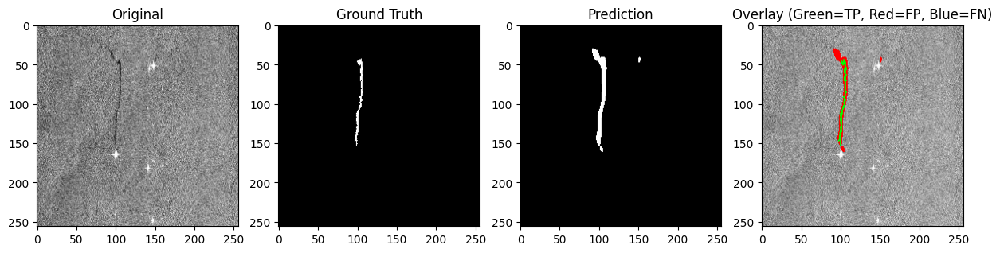

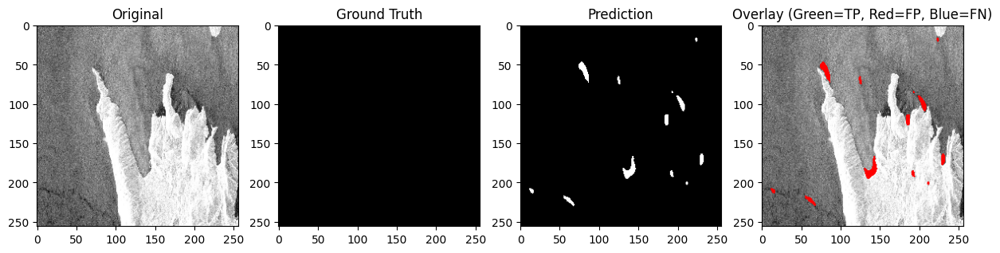

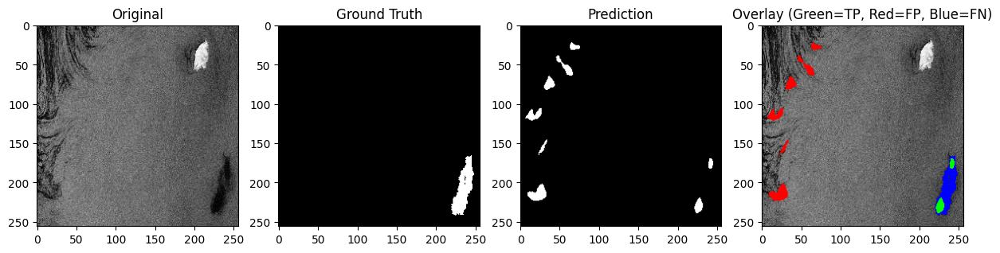

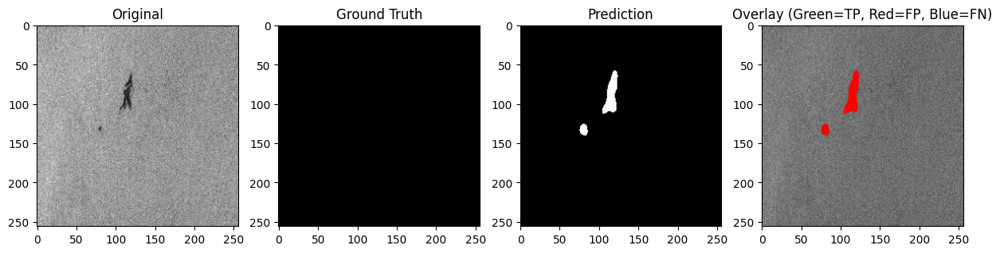

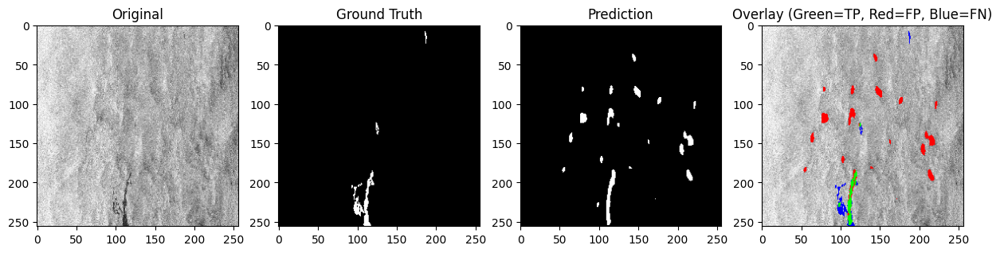

...

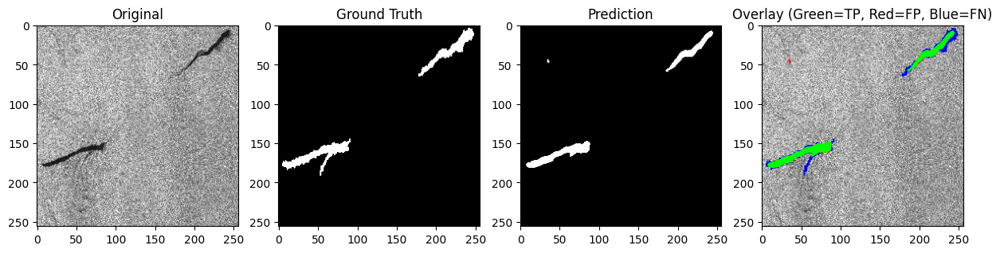

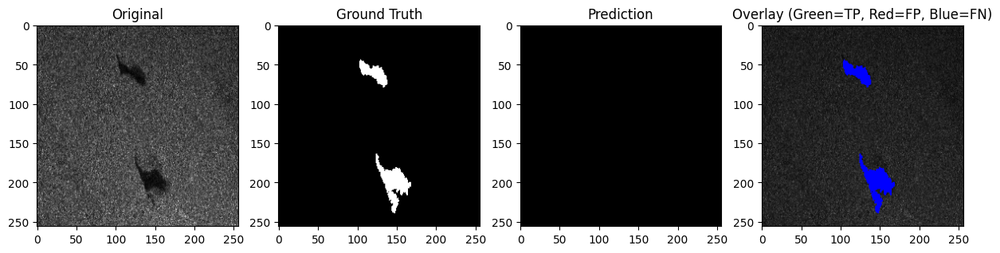

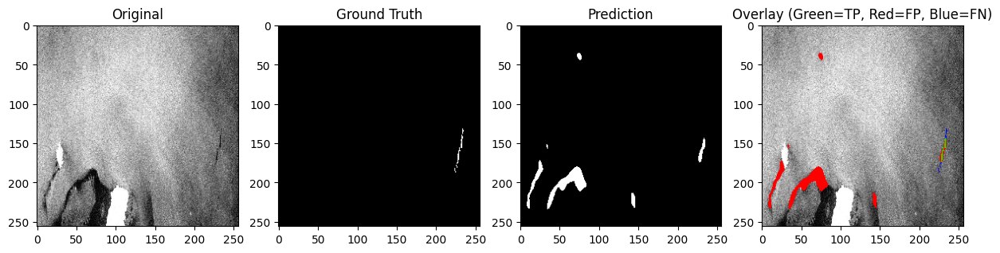

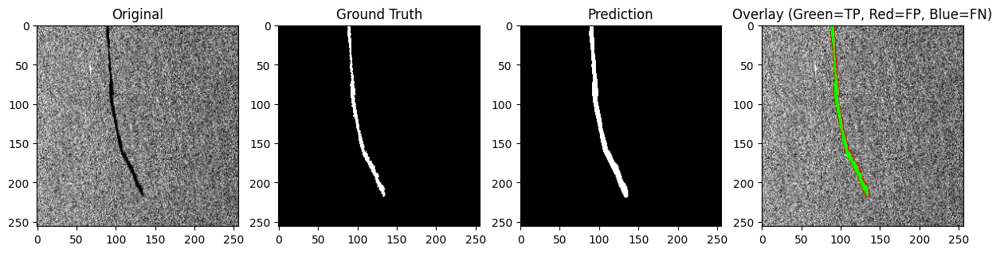

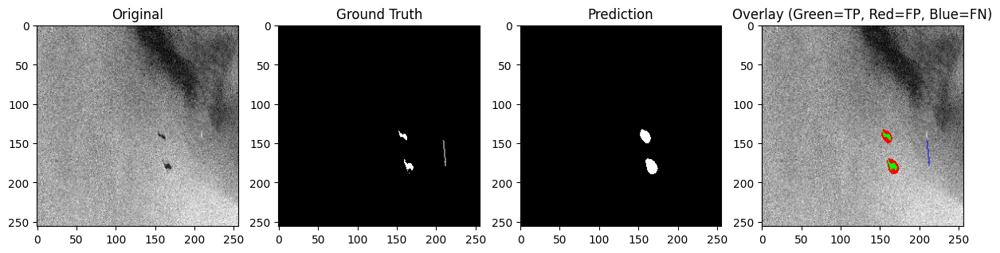

In [39]:
preds = model.predict(X_test[:15])

for i in range(15):
    img = X_test[i].squeeze()
    mask_true = y_test[i].squeeze()
    mask_pred = (preds[i].squeeze() > 0.5)

    img_color = cv2.cvtColor((img*255).astype(np.uint8), cv2.COLOR_GRAY2BGR)

    overlay = img_color.copy()

    # True Positive → Green
    overlay[(mask_true == 1) & (mask_pred == 1)] = [0, 255, 0]

    # False Positive → Red
    overlay[(mask_true == 0) & (mask_pred == 1)] = [255, 0, 0]

    # False Negative → Blue
    overlay[(mask_true == 1) & (mask_pred == 0)] = [0, 0, 255]

    plt.figure(figsize=(15,4))

    plt.subplot(1,4,1)
    plt.imshow(img, cmap='gray')
    plt.title("Original")

    plt.subplot(1,4,2)
    plt.imshow(mask_true, cmap='gray')
    plt.title("Ground Truth")

    plt.subplot(1,4,3)
    plt.imshow(mask_pred, cmap='gray')
    plt.title("Prediction")

    plt.subplot(1,4,4)
    plt.imshow(overlay)
    plt.title("Overlay (Green=TP, Red=FP, Blue=FN)")

    plt.show()

**RED OVERLAY VISUALIZATION**

removes noise -> better visuals 

In [40]:
mask_pred = cv2.medianBlur(mask_pred*255, 5)
mask_pred = (mask_pred > 127).astype(np.uint8)

error: OpenCV(4.12.0) /io/opencv/modules/imgproc/src/median_blur.simd.hpp:887: error: (-210:Unsupported format or combination of formats)  in function 'medianBlur'


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


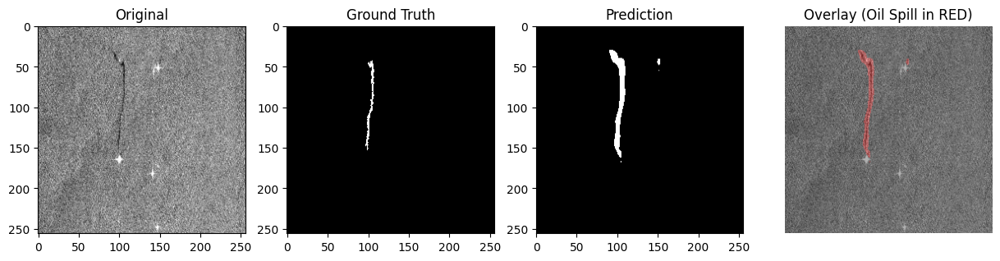

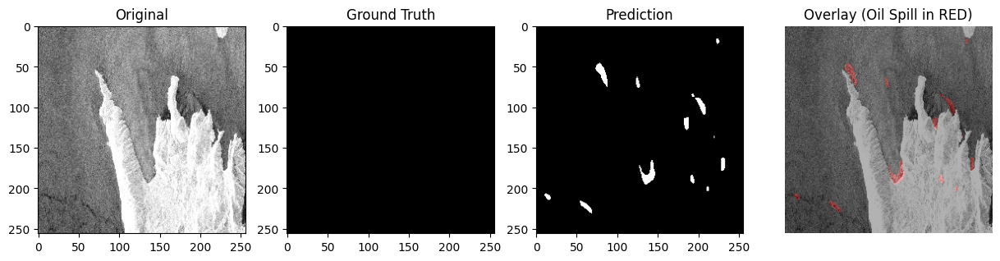

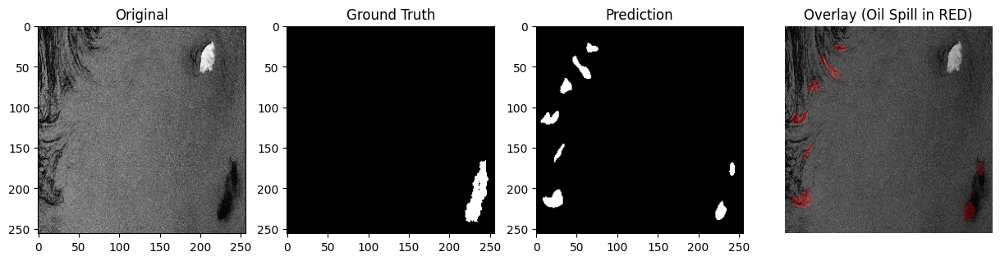

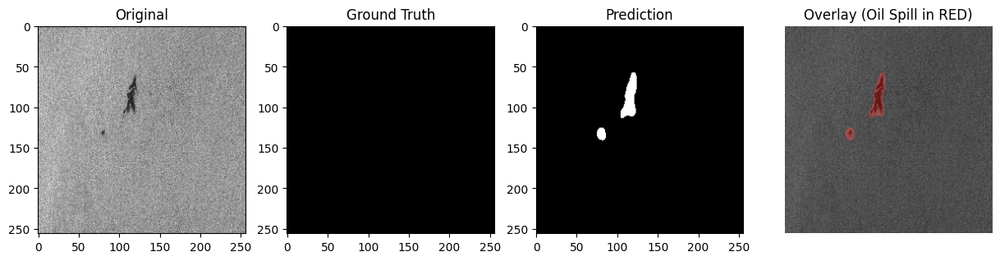

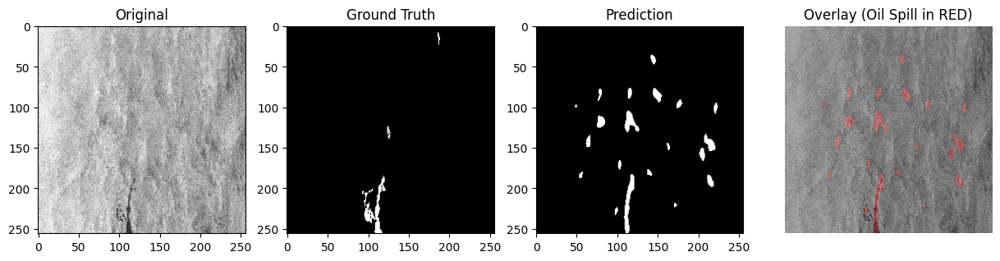

...

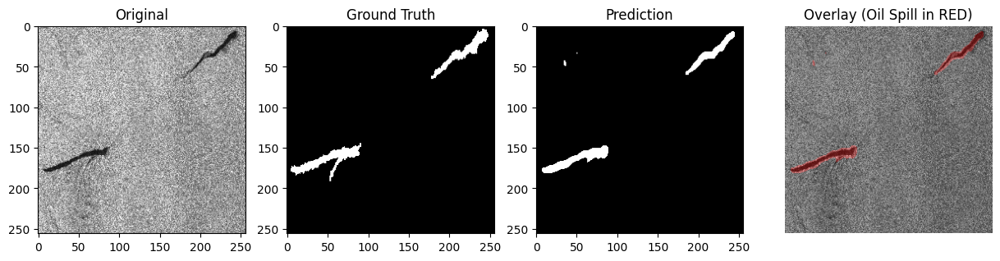

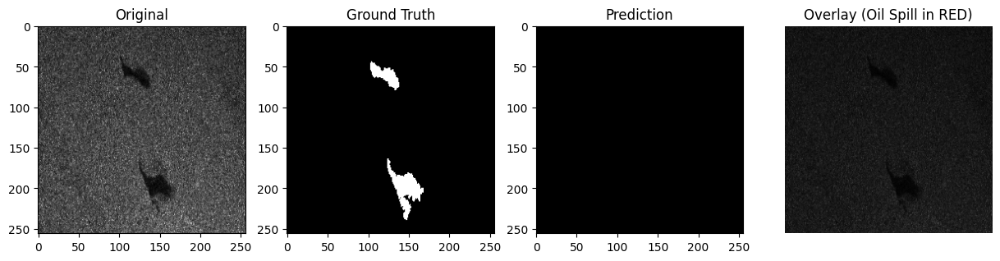

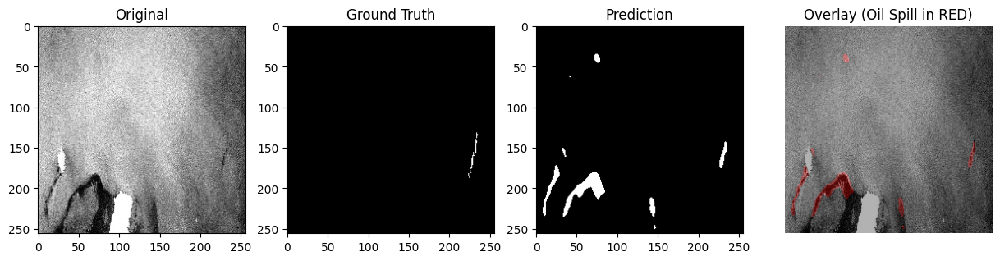

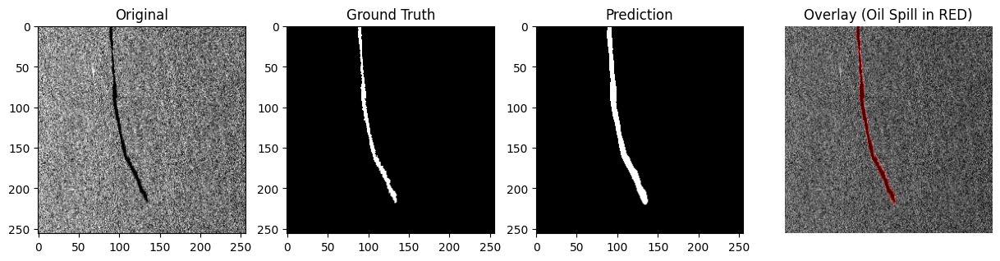

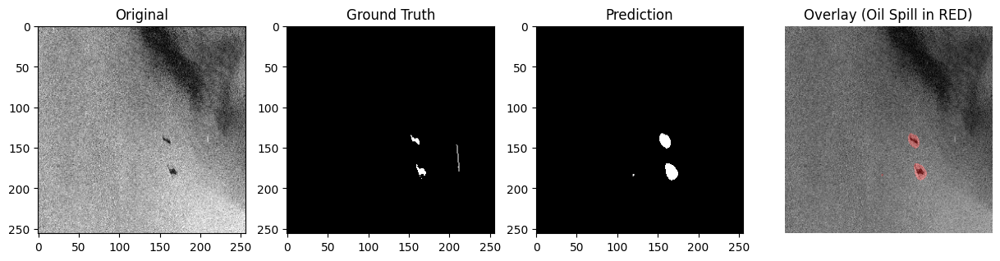

In [41]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

preds = model.predict(X_test[:15])

for i in range(15):
    img = X_test[i].squeeze()
    mask_true = y_test[i].squeeze()
    
    # 🔥 Better threshold
    mask_pred = (preds[i].squeeze() > 0.3).astype(np.uint8)

    # Convert grayscale → RGB
    img_color = cv2.cvtColor((img*255).astype(np.uint8), cv2.COLOR_GRAY2RGB)

    # Create red mask
    red_mask = np.zeros_like(img_color)
    red_mask[:,:,0] = mask_pred * 255   # RED channel

    # Blend image + mask
    overlay = cv2.addWeighted(img_color, 0.7, red_mask, 0.3, 0)

    # ---------- PLOT ----------
    plt.figure(figsize=(15,4))

    plt.subplot(1,4,1)
    plt.imshow(img, cmap='gray')
    plt.title("Original")

    plt.subplot(1,4,2)
    plt.imshow(mask_true, cmap='gray')
    plt.title("Ground Truth")

    plt.subplot(1,4,3)
    plt.imshow(mask_pred, cmap='gray')
    plt.title("Prediction")

    plt.subplot(1,4,4)
    plt.imshow(overlay)
    plt.title("Overlay (Oil Spill in RED)")

    plt.axis('off')
    plt.show()

**THRESHOLD EVALUATION**

In [42]:
from sklearn.metrics import precision_score, recall_score

def evaluate_threshold(model, X, y, threshold):
    preds = model.predict(X)
    preds = (preds > threshold).astype(np.uint8)

    y_flat = y.flatten()
    p_flat = preds.flatten()

    precision = precision_score(y_flat, p_flat)
    recall = recall_score(y_flat, p_flat)

    intersection = np.sum(y_flat*p_flat)
    dice = (2*intersection)/(np.sum(y_flat)+np.sum(p_flat)+1e-7)

    iou = intersection / (np.sum(y_flat)+np.sum(p_flat)-intersection+1e-7)

    print(f"Threshold: {threshold}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"Dice: {dice:.4f}")
    print(f"IoU: {iou:.4f}")
    print("-"*30)

In [43]:
evaluate_threshold(model, X_test, y_test, 0.5)
evaluate_threshold(model, X_test, y_test, 0.4)
evaluate_threshold(model, X_test, y_test, 0.6)

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 409ms/step
Threshold: 0.5
Precision: 0.4944
Recall: 0.5342
Dice: 0.5135
IoU: 0.3454
------------------------------
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 417ms/step
Threshold: 0.4
Precision: 0.4722
Recall: 0.5503
Dice: 0.5083
IoU: 0.3407
------------------------------
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 418ms/step
Threshold: 0.6
Precision: 0.5178
Recall: 0.5166
Dice: 0.5172
IoU: 0.3488
------------------------------


**UNSEEN IMAGES PREDICTION** 

In [44]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def test_unseen_image(model, image_path, threshold=0.5):

    # Load image
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if img is None:
        print("Image not found. Check path.")
        return

    original = img.copy()

    # Resize to model input
    img_resized = cv2.resize(img, (256,256))

    # Normalize
    img_norm = img_resized / 255.0

    # Expand dims
    img_input = np.expand_dims(img_norm, axis=(0,-1))

    # Predict
    pred = model.predict(img_input)[0,:,:,0]

    # Binary mask
    pred_mask = (pred > threshold).astype(np.uint8)

    # Overlay
    overlay = cv2.cvtColor(img_resized.astype(np.uint8), cv2.COLOR_GRAY2RGB)
    overlay[pred_mask==1] = [255,0,0]

    # Plot results
    plt.figure(figsize=(16,4))

    plt.subplot(1,4,1)
    plt.title("Original Sentinel Image")
    plt.imshow(original, cmap='gray')
    plt.axis("off")

    plt.subplot(1,4,2)
    plt.title("Predicted Mask")
    plt.imshow(pred_mask, cmap='gray')
    plt.axis("off")

    plt.subplot(1,4,3)
    plt.title("Overlay Detection")
    plt.imshow(overlay)
    plt.axis("off")

    plt.subplot(1,4,4)
    plt.title("Probability Map")
    plt.imshow(pred, cmap='jet')
    plt.colorbar()
    plt.axis("off")

    plt.show()

    # Oil area estimation
    oil_pixels = np.sum(pred_mask)
    total_pixels = pred_mask.size

    print("Oil pixels detected:", oil_pixels)
    print("Oil coverage:", (oil_pixels/total_pixels)*100, "%")

    return pred_mask

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


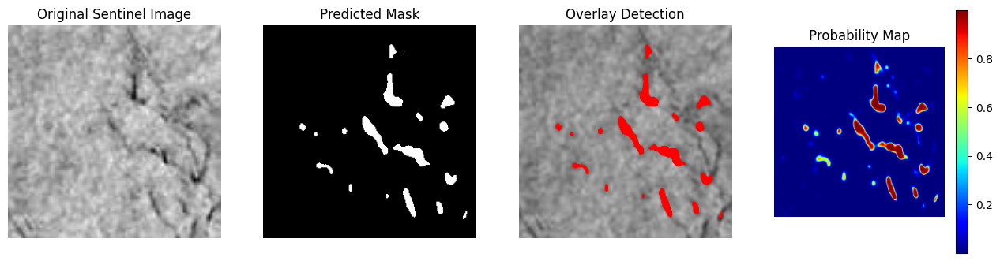

Oil pixels detected: 2518
Oil coverage: 3.8421630859375 %


In [59]:
mask = test_unseen_image(
    model,
    "/kaggle/input/datasets/vpoornachandrika/real-test/test_sar_6.jpg",
    threshold=0.5
)

**THRESHOLD SENSITIVITY**

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


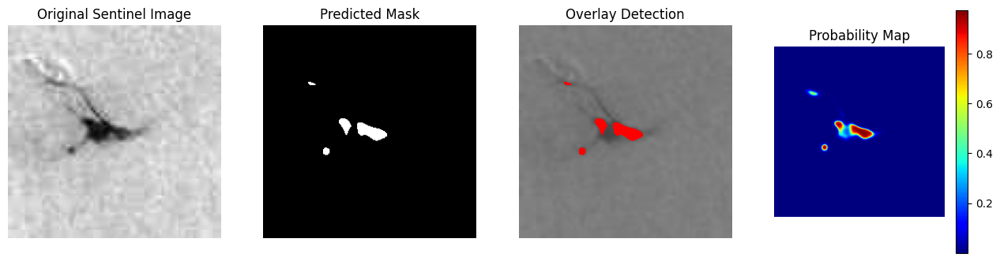

Oil pixels detected: 712
Oil coverage: 1.08642578125 %
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


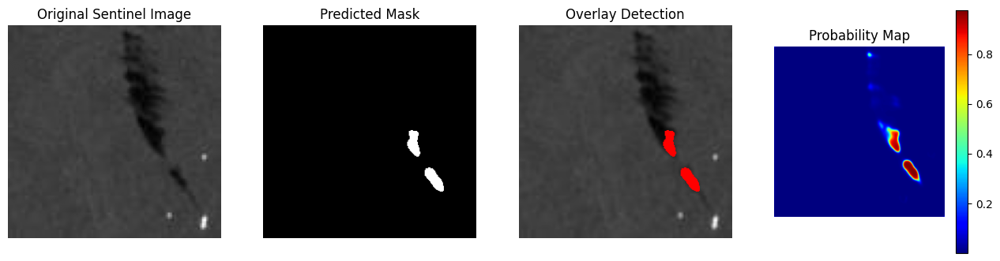

Oil pixels detected: 706
Oil coverage: 1.0772705078125 %


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [51]:
test_unseen_image(model, "/kaggle/input/datasets/vpoornachandrika/test-dataset/test_sar_2.jpg", threshold=0.4)

test_unseen_image(model, "/kaggle/input/datasets/vpoornachandrika/test-dataset/test_sar_3.jpg", threshold=0.6)

**FULL PIPELINE FOR UNSEEN SENTINEL IMAGE PREDICTION ANALYSIS**

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


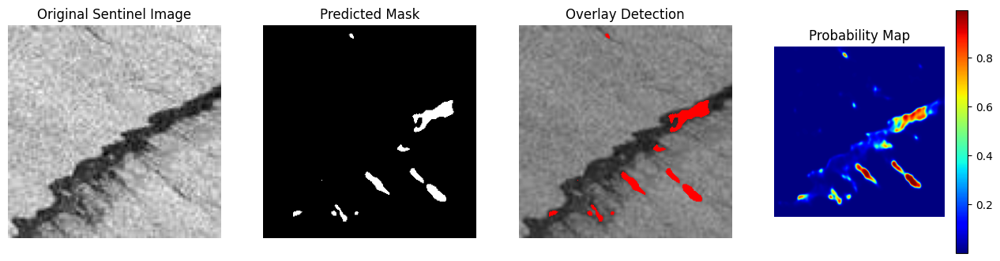

Oil pixels detected: 1645
Oil coverage: 2.51007080078125 %

Prediction Confidence Statistics
Max probability: 0.99545395
Mean probability: 0.0336628
Min probability: 4.5399386e-07

Threshold Sensitivity Check
Threshold: 0.4 | Oil Pixels: 1950 | Coverage: 2.9754638671875 %
Threshold: 0.5 | Oil Pixels: 1645 | Coverage: 2.51007080078125 %
Threshold: 0.6 | Oil Pixels: 1350 | Coverage: 2.0599365234375 %


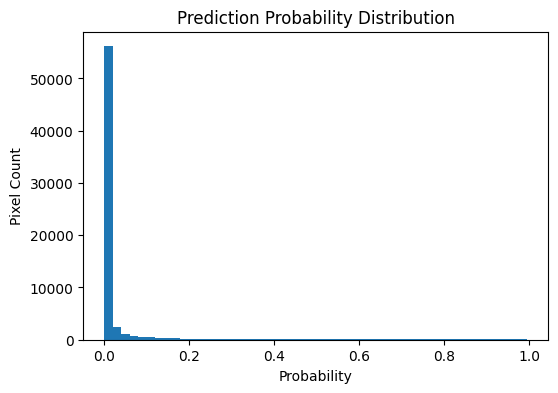

In [52]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# -------- IMAGE PATH --------
image_path = "/kaggle/input/datasets/vpoornachandrika/dataset-test/test_sar.jpg"

# -------- LOAD IMAGE --------
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if img is None:
    print("Image not found. Check path.")
else:

    original = img.copy()

    # Resize for model
    img_resized = cv2.resize(img, (256,256))

    # Normalize
    img_norm = img_resized / 255.0

    # Expand dimensions
    img_input = np.expand_dims(img_norm, axis=(0,-1))

    # -------- MODEL PREDICTION --------
    pred = model.predict(img_input)[0,:,:,0]

    # Default threshold
    threshold = 0.5
    pred_mask = (pred > threshold).astype(np.uint8)

    # -------- OVERLAY --------
    overlay = cv2.cvtColor(img_resized.astype(np.uint8), cv2.COLOR_GRAY2RGB)
    overlay[pred_mask==1] = [255,0,0]

    # -------- VISUALIZATION --------
    plt.figure(figsize=(16,4))

    plt.subplot(1,4,1)
    plt.title("Original Sentinel Image")
    plt.imshow(original, cmap='gray')
    plt.axis("off")

    plt.subplot(1,4,2)
    plt.title("Predicted Mask")
    plt.imshow(pred_mask, cmap='gray')
    plt.axis("off")

    plt.subplot(1,4,3)
    plt.title("Overlay Detection")
    plt.imshow(overlay)
    plt.axis("off")

    plt.subplot(1,4,4)
    plt.title("Probability Map")
    plt.imshow(pred, cmap='jet')
    plt.colorbar()
    plt.axis("off")

    plt.show()

    # -------- OIL AREA ESTIMATION --------
    oil_pixels = np.sum(pred_mask)
    total_pixels = pred_mask.size

    print("Oil pixels detected:", oil_pixels)
    print("Oil coverage:", (oil_pixels/total_pixels)*100, "%")

    # -------- CONFIDENCE STATISTICS --------
    print("\nPrediction Confidence Statistics")
    print("Max probability:", np.max(pred))
    print("Mean probability:", np.mean(pred))
    print("Min probability:", np.min(pred))

    # -------- THRESHOLD SENSITIVITY --------
    print("\nThreshold Sensitivity Check")

    for t in [0.4,0.5,0.6]:
        mask = (pred > t).astype(np.uint8)
        oil_pixels = np.sum(mask)
        coverage = (oil_pixels/mask.size)*100

        print("Threshold:",t,
              "| Oil Pixels:",oil_pixels,
              "| Coverage:",coverage,"%")

    # -------- PROBABILITY DISTRIBUTION --------
    plt.figure(figsize=(6,4))
    plt.hist(pred.flatten(), bins=50)
    plt.title("Prediction Probability Distribution")
    plt.xlabel("Probability")
    plt.ylabel("Pixel Count")
    plt.show()

In [ ]:
import os

base_path = "/kaggle/input/datasets/vpoornachandrika/"

for root, dirs, files in os.walk(base_path):
    print(root)
    for f in files[:5]:  # show few files
        print("   ", f)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


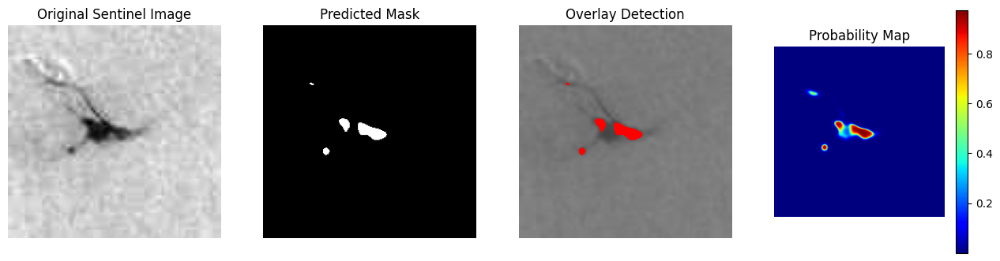

Oil pixels detected: 617
Oil coverage: 0.94146728515625 %

Prediction Confidence Statistics
Max probability: 0.9737812
Mean probability: 0.011433619
Min probability: 5.0602114e-07

Threshold Sensitivity Check
Threshold: 0.4 | Oil Pixels: 712 | Coverage: 1.08642578125 %
Threshold: 0.5 | Oil Pixels: 617 | Coverage: 0.94146728515625 %
Threshold: 0.6 | Oil Pixels: 522 | Coverage: 0.7965087890625 %


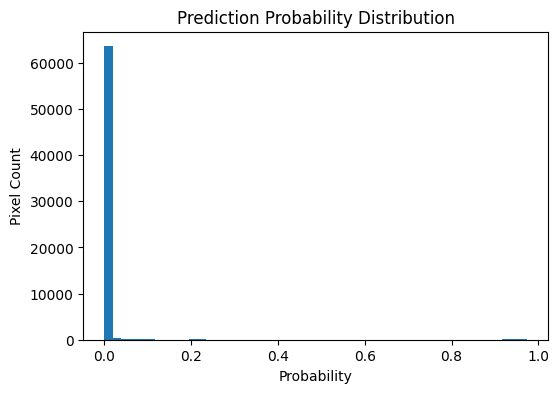

In [54]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# -------- IMAGE PATH --------
image_path = "/kaggle/input/datasets/vpoornachandrika/test-dataset/test_sar_2.jpg"

# -------- LOAD IMAGE --------
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if img is None:
    print("Image not found. Check path.")
else:

    original = img.copy()

    # Resize for model
    img_resized = cv2.resize(img, (256,256))

    # Normalize
    img_norm = img_resized / 255.0

    # Expand dimensions
    img_input = np.expand_dims(img_norm, axis=(0,-1))

    # -------- MODEL PREDICTION --------
    pred = model.predict(img_input)[0,:,:,0]

    # Default threshold
    threshold = 0.5
    pred_mask = (pred > threshold).astype(np.uint8)

    # -------- OVERLAY --------
    overlay = cv2.cvtColor(img_resized.astype(np.uint8), cv2.COLOR_GRAY2RGB)
    overlay[pred_mask==1] = [255,0,0]

    # -------- VISUALIZATION --------
    plt.figure(figsize=(16,4))

    plt.subplot(1,4,1)
    plt.title("Original Sentinel Image")
    plt.imshow(original, cmap='gray')
    plt.axis("off")

    plt.subplot(1,4,2)
    plt.title("Predicted Mask")
    plt.imshow(pred_mask, cmap='gray')
    plt.axis("off")

    plt.subplot(1,4,3)
    plt.title("Overlay Detection")
    plt.imshow(overlay)
    plt.axis("off")

    plt.subplot(1,4,4)
    plt.title("Probability Map")
    plt.imshow(pred, cmap='jet')
    plt.colorbar()
    plt.axis("off")

    plt.show()

    # -------- OIL AREA ESTIMATION --------
    oil_pixels = np.sum(pred_mask)
    total_pixels = pred_mask.size

    print("Oil pixels detected:", oil_pixels)
    print("Oil coverage:", (oil_pixels/total_pixels)*100, "%")

    # -------- CONFIDENCE STATISTICS --------
    print("\nPrediction Confidence Statistics")
    print("Max probability:", np.max(pred))
    print("Mean probability:", np.mean(pred))
    print("Min probability:", np.min(pred))

    # -------- THRESHOLD SENSITIVITY --------
    print("\nThreshold Sensitivity Check")

    for t in [0.4,0.5,0.6]:
        mask = (pred > t).astype(np.uint8)
        oil_pixels = np.sum(mask)
        coverage = (oil_pixels/mask.size)*100

        print("Threshold:",t,
              "| Oil Pixels:",oil_pixels,
              "| Coverage:",coverage,"%")

    # -------- PROBABILITY DISTRIBUTION --------
    plt.figure(figsize=(6,4))
    plt.hist(pred.flatten(), bins=50)
    plt.title("Prediction Probability Distribution")
    plt.xlabel("Probability")
    plt.ylabel("Pixel Count")
    plt.show()